In [1]:
import keras
from keras import layers
import numpy as np
import matplotlib.pyplot as plt
from sklearn.neighbors import NearestNeighbors
import pandas as pd
from pandas.plotting import register_matplotlib_converters
import os
import math
from sklearn.cluster import KMeans
from sklearn.metrics import precision_score
import seaborn as sns
from sklearn import metrics
import time
import pickle
import metric_learn
from sklearn.decomposition import PCA  
from sklearn import cluster, datasets, mixture
from sklearn.neighbors import LocalOutlierFactor
import functools
import tempfile
import datetime
import tensorflow as tf
import mlflow
from mlflow.models import infer_signature
from sklearn.metrics import accuracy_score, precision_score, recall_score
from sklearn.model_selection import train_test_split
from tensorflow.keras import layers, losses
from tensorflow.keras.datasets import fashion_mnist
from tensorflow.keras.models import Model
from tensorflow.keras import regularizers
from tensorflow.python.client import device_lib; print(device_lib.list_local_devices())
import tensorflow as tf
tf.config.list_physical_devices('GPU')
from utils import make_data, make_data_rev, make_label, calc_leq, leq_filter, validate, figure, figure_detail, plot_timeseries, fig_pr, auc_gs, fig_th_f

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 4797259747258695984
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 7798259712
locality {
  bus_id: 1
  links {
  }
}
incarnation: 5025195646748854768
physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 3080, pci bus id: 0000:01:00.0, compute capability: 8.6"
xla_global_id: 416903419
]
[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 8831450723559892659
xla_global_id: -1
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 7798259712
locality {
  bus_id: 1
  links {
  }
}
incarnation: 13072575292661462153
physical_device_desc: "device: 0, name: NVIDIA GeForce RTX 3080, pci bus id: 0000:01:00.0, compute capability: 8.6"
xla_global_id: 416903419
]


In [2]:
data_dir='filtered_csv_label'
original = pd.read_csv( os.path.join(data_dir, 'learning_data_10.csv') )
df = pd.read_csv( os.path.join(data_dir, 'learning_data_10.csv') )
df=df[df['day']<=9]
df

,original,label,time,day
0,53.4,0,15,0
1,52.8,0,15,0
2,52.8,0,15,0
3,53.2,0,15,0
4,53.6,0,15,0
...,...,...,...,...
3995345,45.9,0,5,9
3995346,45.6,0,5,9
3995347,45.8,0,5,9
3995348,45.7,0,5,9


## ホールドアウト検証
## 訓練、テストへ分割
* テスト（最終評価用）：6, 7, 8, 9 日目
---
ラベル付け
* 全体：0, 1, 2, 3, 4, 5 日目
* 訓練ローテ：(訓練、ラベル付与対象)=([0, 1, 2, 3, 4], 5)・・・([5, 0, 1, 2, 3], 4)

In [3]:
test_day=[6, 7, 8, 9]
semi_train_day=[0, 1, 2, 3, 4, 5]

test_df=df[(df['day'].isin(test_day))].reset_index(drop=True)
semi_train_df=df[(df['day'].isin(semi_train_day))].reset_index(drop=True)

In [4]:
df_list=[]

window=15
for i in set(df['day']):
    lag=[] 
    lag.append(make_data_rev(semi_train_df.loc[semi_train_df['day']==i, ['original']], 'original', window))
    lag.append(semi_train_df.loc[semi_train_df['day']==i, ['day']])
    lag.append(semi_train_df.loc[semi_train_df['day']==i, ['label']])
    df_add_lag=pd.concat(lag, axis=1)
    df_list.append(df_add_lag)
semi_train_df=pd.concat(df_list)
semi_train_df=semi_train_df.dropna().reset_index(drop=True)
semi_train_df.loc[:, 'lstmaed']=0
semi_train_df.loc[:, 'lstmaed_label']=0

In [5]:
semi_train_df

,original,original_next1,original_next2,original_next3,original_next4,original_next5,original_next6,original_next7,original_next8,original_next9,original_next10,original_next11,original_next12,original_next13,original_next14,day,label,lstmaed,lstmaed_label
0,53.4,52.8,52.8,53.2,53.6,54.0,54.7,55.7,55.5,55.7,55.6,55.8,55.7,55.0,54.9,0,0,0,0
1,52.8,52.8,53.2,53.6,54.0,54.7,55.7,55.5,55.7,55.6,55.8,55.7,55.0,54.9,54.9,0,0,0,0
2,52.8,53.2,53.6,54.0,54.7,55.7,55.5,55.7,55.6,55.8,55.7,55.0,54.9,54.9,54.9,0,0,0,0
3,53.2,53.6,54.0,54.7,55.7,55.5,55.7,55.6,55.8,55.7,55.0,54.9,54.9,54.9,55.0,0,0,0,0
4,53.6,54.0,54.7,55.7,55.5,55.7,55.6,55.8,55.7,55.0,54.9,54.9,54.9,55.0,55.0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2393321,45.2,45.0,44.6,45.2,44.9,44.9,45.1,45.7,45.0,45.6,45.4,44.8,45.1,45.4,45.0,5,0,0,0
2393322,45.0,44.6,45.2,44.9,44.9,45.1,45.7,45.0,45.6,45.4,44.8,45.1,45.4,45.0,45.2,5,0,0,0
2393323,44.6,45.2,44.9,44.9,45.1,45.7,45.0,45.6,45.4,44.8,45.1,45.4,45.0,45.2,45.1,5,0,0,0
2393324,45.2,44.9,44.9,45.1,45.7,45.0,45.6,45.4,44.8,45.1,45.4,45.0,45.2,45.1,45.1,5,0,0,0


## LSTM_autoencoder

2024/01/04 17:12:41 INFO mlflow.tracking.fluent: Autologging successfully enabled for tensorflow.
2024/01/04 17:12:41 INFO mlflow.tracking.fluent: Autologging successfully enabled for sklearn.
2024/01/04 17:12:41 WARNING mlflow.utils.git_utils: Failed to import Git (the Git executable is probably not on your PATH), so Git SHA is not available. Error: Failed to initialize: Bad git executable.
The git executable must be specified in one of the following ways:
    - be included in your $PATH
    - be set via $GIT_PYTHON_GIT_EXECUTABLE
    - explicitly set via git.refresh()

All git commands will error until this is rectified.

This initial warning can be silenced or aggravated in the future by setting the
$GIT_PYTHON_REFRESH environment variable. Use one of the following values:
    - quiet|q|silence|s|none|n|0: for no warning or exception
    - warn|w|warning|1: for a printed warning
    - error|e|raise|r|2: for a raised exception

Example:
    export GIT_PYTHON_REFRESH=quiet



units:1
訓練データ：[0, 2, 3, 4, 5]
ラベル付与データ：[1]日目
Epoch 1/2
2057/2057 [==============================] - 22s 8ms/step - loss: 0.0743 - val_loss: 0.0250
Epoch 2/2
2057/2057 [==============================] - 17s 8ms/step - loss: 0.0145 - val_loss: 0.0165


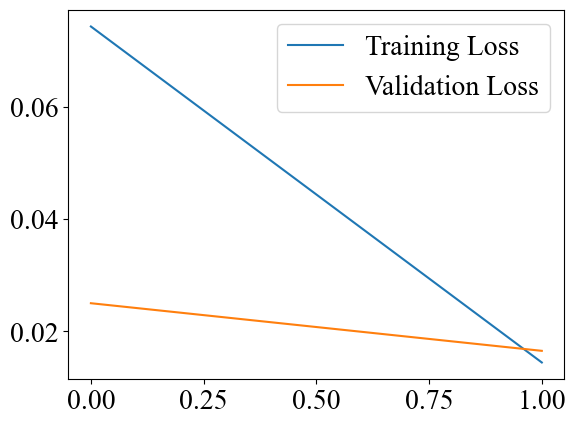

8984/8984 [==============================] - 18s 2ms/step
------------------------------------------------------


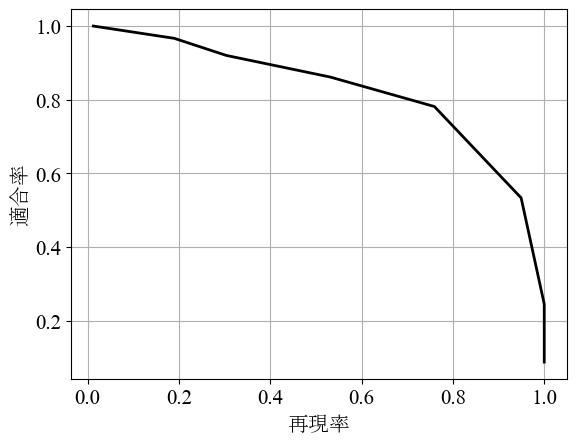

AUC：0.8164420497608563
理想の閾値：0.34285714285714286
F値（最高）：0.7703281027104137
適合率（F値が最高の時）：0.7814761215629522
再現率（F値が最高の時）：0.759493670886076
C:\Users\Arakawa\AppData\Local\Temp\tmph_lrn2u9\predict_results.png


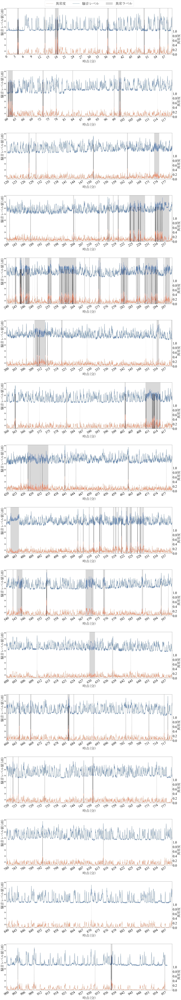

1/1 [==============================] - 0s 14ms/step


INFO:tensorflow:Assets written to: C:\Users\Arakawa\AppData\Local\Temp\tmpol7uwk7z\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\Arakawa\AppData\Local\Temp\tmpol7uwk7z\model\data\model\assets
C:\Users\Arakawa\anaconda3\envs\tf291\lib\site-packages\_distutils_hack\__init__.py:33: UserWarning: Setuptools is replacing distutils.
  warnings.warn("Setuptools is replacing distutils.")
Registered model 'LSTM_autoencoder' already exists. Creating a new version of this model...
Created version '73' of model 'LSTM_autoencoder'.


units:2
訓練データ：[0, 2, 3, 4, 5]
ラベル付与データ：[1]日目
Epoch 1/2
   4/2057 [..............................] - ETA: 36s - loss: 0.1351    WARNING:tensorflow:Callback method `on_train_batch_end` is slow compared to the batch time (batch time: 0.0076s vs `on_train_batch_end` time: 0.1213s). Check your callbacks.


2057/2057 [==============================] - 22s 9ms/step - loss: 0.0190 - val_loss: 0.0159
Epoch 2/2
2057/2057 [==============================] - 19s 9ms/step - loss: 0.0123 - val_loss: 0.0157


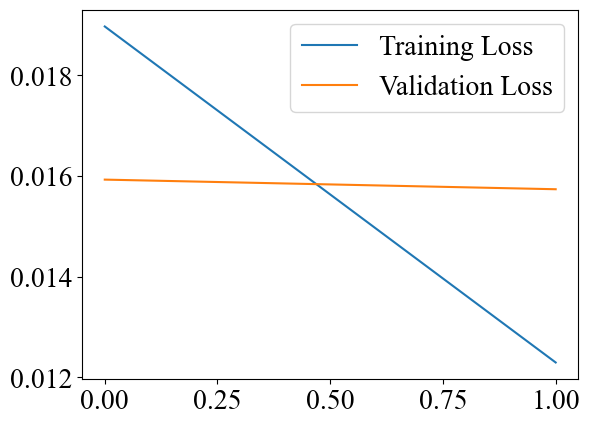

8984/8984 [==============================] - 26s 3ms/step
------------------------------------------------------


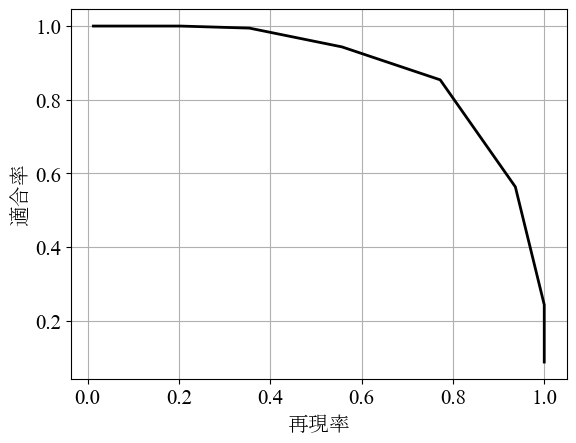

AUC：0.8731139041241492
理想の閾値：0.34285714285714286
F値（最高）：0.81099532878189
適合率（F値が最高の時）：0.853953840332955
再現率（F値が最高の時）：0.7721518987341772
C:\Users\Arakawa\AppData\Local\Temp\tmpecl7b2by\predict_results.png


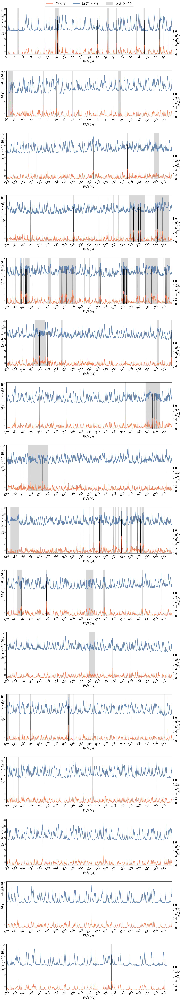

1/1 [==============================] - 0s 16ms/step


INFO:tensorflow:Assets written to: C:\Users\Arakawa\AppData\Local\Temp\tmpdiy_xw8b\model\data\model\assets


INFO:tensorflow:Assets written to: C:\Users\Arakawa\AppData\Local\Temp\tmpdiy_xw8b\model\data\model\assets
Registered model 'LSTM_autoencoder' already exists. Creating a new version of this model...
Created version '74' of model 'LSTM_autoencoder'.


In [6]:
mlflow.autolog(log_models=False)

# 実験をアクティブ化(設定)する。ない場合は新たな実験を作成してアクティブ化する
mlflow.set_experiment("debug")
run_name='result'
best_auc=0
with mlflow.start_run(run_name=run_name):
    units_s, units_e=(1, 3)
    for unit in range(units_s, units_e):
        data_dir='filtered_csv_label'
        original = pd.read_csv( os.path.join(data_dir, 'learning_data_10.csv') )
        df = pd.read_csv( os.path.join(data_dir, 'learning_data_10.csv') )
        df=df[df['day']<=9]
        test_day=[6, 7, 8, 9]
        semi_train_day=[0, 1, 2, 3, 4, 5]

        test_df=df[(df['day'].isin(test_day))].reset_index(drop=True)
        semi_train_df=df[(df['day'].isin(semi_train_day))].reset_index(drop=True)
        df_list=[]
        window=15
        for i in set(df['day']):
            lag=[] 
            lag.append(make_data_rev(semi_train_df.loc[semi_train_df['day']==i, ['original']], 'original', window))
            lag.append(semi_train_df.loc[semi_train_df['day']==i, ['day']])
            lag.append(semi_train_df.loc[semi_train_df['day']==i, ['label']])
            df_add_lag=pd.concat(lag, axis=1)
            df_list.append(df_add_lag)
        semi_train_df=pd.concat(df_list)
        semi_train_df=semi_train_df.dropna().reset_index(drop=True)
        semi_train_df.loc[:, 'lstmaed']=0
        semi_train_df.loc[:, 'lstmaed_label']=0

        print('======================================================')

        units=unit
        print(f'units:{units}')
        LSTM_autoencoder = keras.Sequential()
        LSTM_autoencoder.add(keras.layers.LSTM(
            units=units,
            input_shape=(window, 1),
        ))
        # LSTM_autoencoder.add(keras.layers.Dropout(rate=0.5))
        LSTM_autoencoder.add(keras.layers.RepeatVector(n=window))
        LSTM_autoencoder.add(keras.layers.LSTM(
            units=units, 
            return_sequences=True,
        ))
        # LSTM_autoencoder.add(keras.layers.Dropout(rate=0.5))
        LSTM_autoencoder.add(
          keras.layers.TimeDistributed(
            keras.layers.Dense(units=1)
          )
        )

        # テストデータとする日
        i=[1]
        label_train_day=[k for k in semi_train_day if k not in i]
        label_grant_day=i
        print(f'訓練データ：{label_train_day}')
        print(f'ラベル付与データ：{label_grant_day}日目')
        # Log the hyperparameters
        mlflow.log_params({'trainday':label_train_day, 'testday':label_grant_day, 
                           'window_size':window, 'units_range':f'range({units_s},{units_e})'})

        semi_train_x=semi_train_df[(semi_train_df['day'].isin(label_train_day))][semi_train_df.columns[:-4]].reset_index(drop=True)
        labeling_x=semi_train_df[(semi_train_df['day'].isin(label_grant_day))][semi_train_df.columns[:-4]].reset_index(drop=True)
        # tf.reduce_min関数を使用して、train_dataテンソル内の最小値を計算しています。
        # min_valにはtrain_data内の最小値が代入されます。
        min_val = tf.reduce_min(semi_train_x)
        # tf.reduce_max関数を使用して、train_dataテンソル内の最大値を計算しています。
        # max_valにはtrain_data内の最大値が代入されます。
        max_val = tf.reduce_max(semi_train_x)
        train_data = (semi_train_x.values - min_val) / (max_val - min_val)
        labeling_data = (labeling_x.values - min_val) / (max_val - min_val)

        # データをモデルに入力する形状に整形し,データの型をtf.float32に変換
        train_data = tf.cast(train_data[:, :, np.newaxis], tf.float32)
        labeling_data = tf.cast(labeling_data[:, :, np.newaxis], tf.float32)

        LSTM_autoencoder.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.001), 
                                 loss='mae')

        callback = tf.keras.callbacks.EarlyStopping(
            monitor='val_loss',
            min_delta=0,
            patience=10,
            restore_best_weights=True
        )
        log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
        tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

        history = LSTM_autoencoder.fit(train_data, train_data, 
              epochs=2, 
              batch_size=1024,
              validation_data=(labeling_data, labeling_data),
              callbacks=[callback],
              shuffle=True)

        plt.plot(history.history["loss"], label="Training Loss")
        plt.plot(history.history["val_loss"], label="Validation Loss")
        plt.legend()
        plt.show()

        reconstructions = LSTM_autoencoder.predict(labeling_data)
        #     異常度算出
        d= tf.keras.losses.mae(reconstructions[:, :, 0], labeling_data[:, :, 0]).numpy()
        semi_train_df.loc[semi_train_df['day'].isin(label_grant_day), 'lstmaed']=d
        print('------------------------------------------------------')

        test_v=semi_train_df.loc[semi_train_df['day'].isin(label_grant_day), ['original', 'label']].copy().reset_index(drop=True)
        d_test=(d-d.min())/(d.max()-d.min())

        thr_bins=10
        p_score, r_score, f_score, thresholds, thr, auc = fig_pr(test_v, d_test, thr_bins)
        f_max=f_score.max()
        p_max=p_score[np.argmax(f_score)]
        r_max=r_score[np.argmax(f_score)]
        print('\033[31m'+f'AUC：{auc}'+'\033[0m')
        print(f'理想の閾値：{thr}')
        print(f'F値（最高）：{f_max}')
        print(f'適合率（F値が最高の時）：{p_max}')
        print(f'再現率（F値が最高の時）：{r_max}')

        if best_auc<auc:
            best_auc=auc
            best_parameters = {'units': units}
            # ベストパラメータを上書き
            mlflow.log_metric("best_parameter-units", best_parameters['units'])
            
            ################################################
            # Log the loss metric
            mlflow.log_metric("test_AUC", auc)
            mlflow.log_metric("test_Fscore_best", f_max)
            mlflow.log_metric("test_Precision_when Fscore Best", p_max)
            mlflow.log_metric("test_Recall_when Fscore Best", r_max)

            # 一時ディレクトリに予測結果のグラフを保存して，mlflowに送信する
            with tempfile.TemporaryDirectory()  as tmp:
                filename = os.path.join(tmp, "predict_results.png")
                plot_timeseries([test_v['original'].values], test_v['label'].values, d=d_test, thr=thr, mlflow=filename)
                mlflow.log_artifact(filename, artifact_path="plot_timeseries")

        #     モデルの構造を定義しているソースコードを保存
            mlflow.log_artifact('LSTM_autoencoder_HO.ipynb', artifact_path="source_code")    
            # Log the model
            signature= infer_signature(labeling_data.numpy()[:2], LSTM_autoencoder.predict(labeling_data.numpy()[:2]))
            input_example= labeling_data.numpy()[:2]
            mlflow.tensorflow.log_model(
                LSTM_autoencoder, 
                artifact_path="LSTM_autoencoder",
                signature=signature,
                registered_model_name="LSTM_autoencoder",
                input_example= input_example
            )

In [7]:
! mlflow gc --backend-store-uri ./mlruns

In [ ]:
! mlflow ui --port 5004 

In [ ]:
best_parameters

In [ ]:
str(best_parameters)